In [1]:
# imports
import panel as pn
pn.extension('plotly')
import plotly.express as px
import pandas as pd
import numpy as np
import hvplot.pandas
import matplotlib.pyplot as plt
import os
from pathlib import Path
from dotenv import load_dotenv

from MCForecastTools import MCSimulation
%matplotlib inline


Bad key "text.kerning_factor" on line 4 in
C:\Users\roset\anaconda3\envs\pyvizenv\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


In [126]:
# Reading daily returns csv
esg_daily_return_csv = Path("Resources/esg_daily_returns.csv")
esg_daily_return = pd.read_csv(esg_daily_return_csv, index_col = "Date", infer_datetime_format = True, parse_dates = True)
esg_daily_return.sort_index(inplace = True)

sin_daily_return_csv = Path("Resources/sin_daily_returns.csv")
sin_daily_return = pd.read_csv(sin_daily_return_csv, index_col = "Date", infer_datetime_format = True, parse_dates = True)
sin_daily_return.sort_index(inplace = True)

# Reading price csv
esg_price_data_csv = Path("Resources/esg_price_data.csv")
esg_price_data = pd.read_csv(esg_price_data_csv, index_col = "Date", infer_datetime_format = True, parse_dates = True)
esg_price_data.sort_index(inplace = True)

sin_price_data_csv = Path("Resources/sin_price_data.csv")
sin_price_data = pd.read_csv(sin_price_data_csv, index_col = "Date", infer_datetime_format = True, parse_dates = True)
sin_price_data.sort_index(inplace = True)

# Add close column
esg_price_data.columns = pd.MultiIndex.from_product([esg_price_data.columns,["close"]])
sin_price_data.columns = pd.MultiIndex.from_product([sin_price_data.columns,["close"]])

# Define portfolio weights
esg_column_len = len(esg_daily_return.columns)
esg_weights = [1/esg_column_len for i in range(esg_column_len)]
esg_portfolio = esg_daily_return.dot(esg_weights)

sin_column_len = len(sin_daily_return.columns)
sin_weights = [1/sin_column_len for i in range(sin_column_len)]
sin_portfolio = sin_daily_return.dot(sin_weights)

# Concat the dataframe
combined_port = pd.concat([esg_portfolio, sin_portfolio], axis = 'columns', join = 'inner')

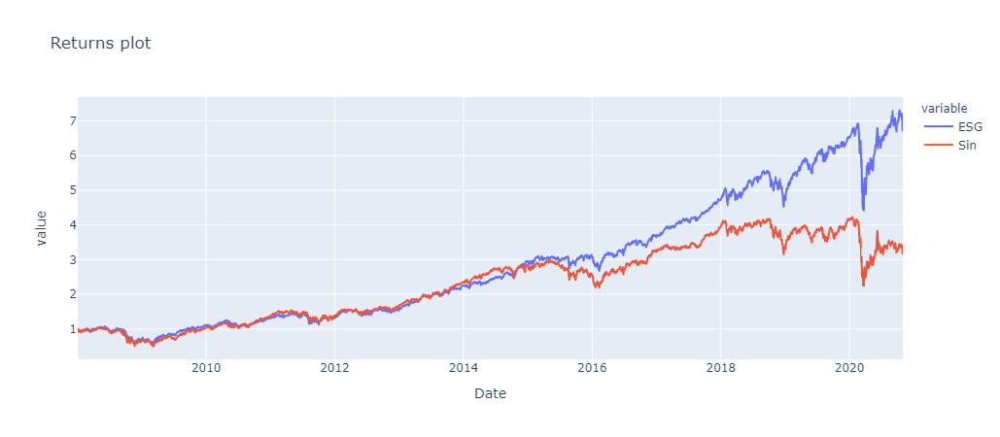

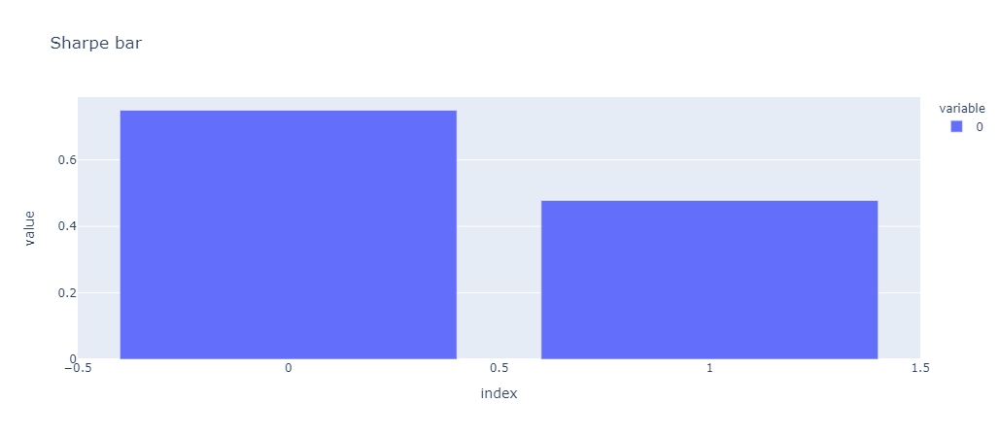

In [127]:
# Combined portfolio returns
combined_port_returns = (1 + combined_port).cumprod()
combined_port_returns.reset_index(inplace=True)
combined_port_returns.columns = ['Date', 'ESG', 'Sin']


# Combined portfolio plot
return_plot = px.line(
    combined_port_returns,
    x="Date",
    y=['ESG','Sin'],
    title="Returns plot",
)
return_plot.show()


# Combined sharpe bar
combined_port_annual_sharpe = (combined_port.mean() * 252) / (combined_port.std() * np.sqrt(252))
sharpe_bar = px.bar(
    combined_port_annual_sharpe,
    title="Sharpe bar",
)
sharpe_bar.show()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


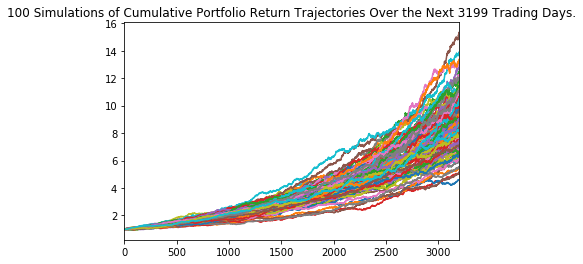

In [114]:
# Configuring a Monte Carlo simulation for ESG return for entire time line
MC_esg_price = MCSimulation(
    portfolio_data = esg_price_data,
    num_simulation = 100,
    num_trading_days = 3199
)

# Configuring a Monte Carlo simulation for Sin return for entire time line
MC_sin_price = MCSimulation(
    portfolio_data = sin_price_data,
    num_simulation = 100,
    num_trading_days = 3199
)
    
# Running a Monte Carlo simulation for ESG entire time line
MC_esg_price.calc_cumulative_return()
    
# Running a Monte Carlo simulation for Sin entire time line
MC_sin_price.calc_cumulative_return()
    
# Plot ESG simulation outcomes for entire time line
esg_plot = MC_esg_price.plot_simulation()

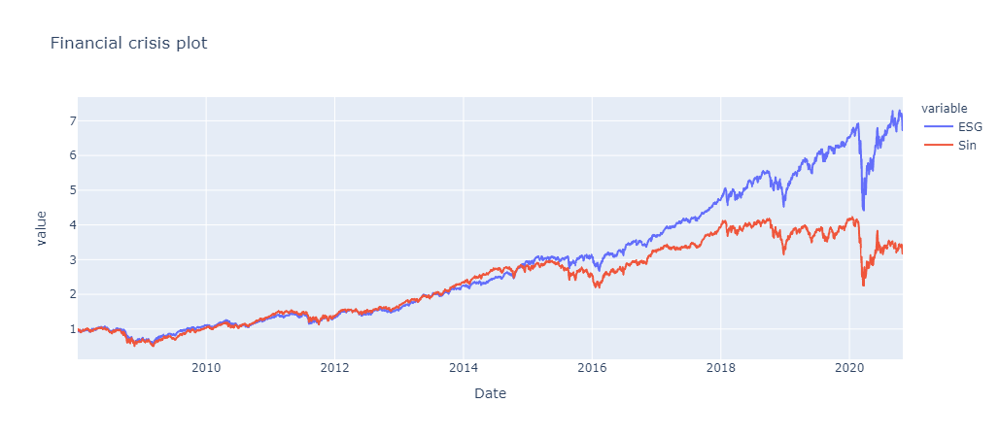

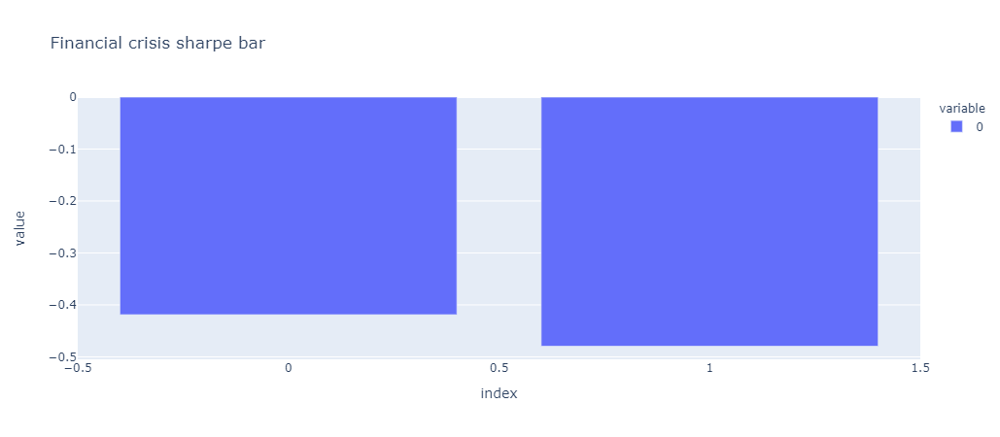

In [132]:
# Longest financial crisis Time Line
fin_cris_combined_port = combined_port.truncate('2008-09-15', '2009-04-02')
    
# Total return for financial crisis time line
fin_cris_combined_port_returns = (1 + fin_cris_combined_port).cumprod()
fin_cris_combined_port_returns.reset_index(inplace=True)
fin_cris_combined_port_returns.columns=['Date','ESG','Sin']

# Plotting
fin_cris_plot = px.line(
    combined_port_returns,
    x="Date",
    y=['ESG','Sin'],
    title="Financial crisis plot",
)
fin_cris_plot.show()

    
# Sharpe ratio for financial crisis time line
fin_cris_combined_port_annual_sharpe = (fin_cris_combined_port.mean() * 252) / (fin_cris_combined_port.std() * np.sqrt(252))
fin_cris_sharpe = px.bar(
    fin_cris_combined_port_annual_sharpe,
    title="Financial crisis sharpe bar",
)
fin_cris_sharpe.show()

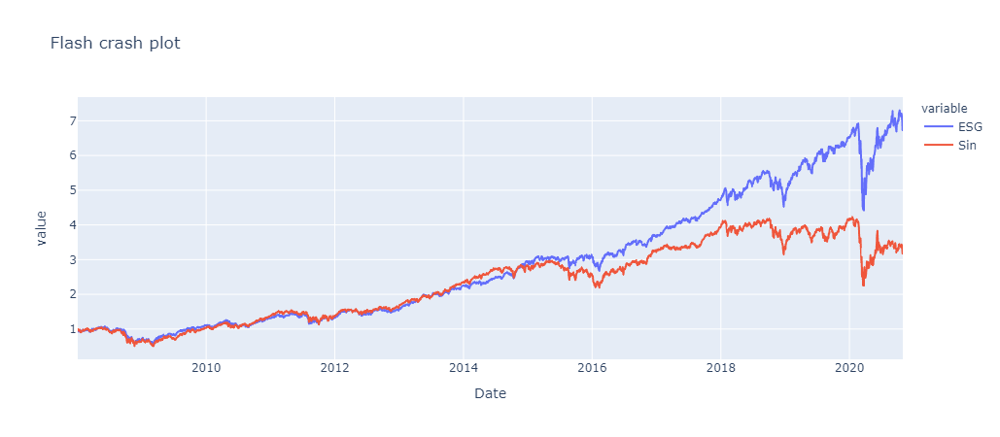

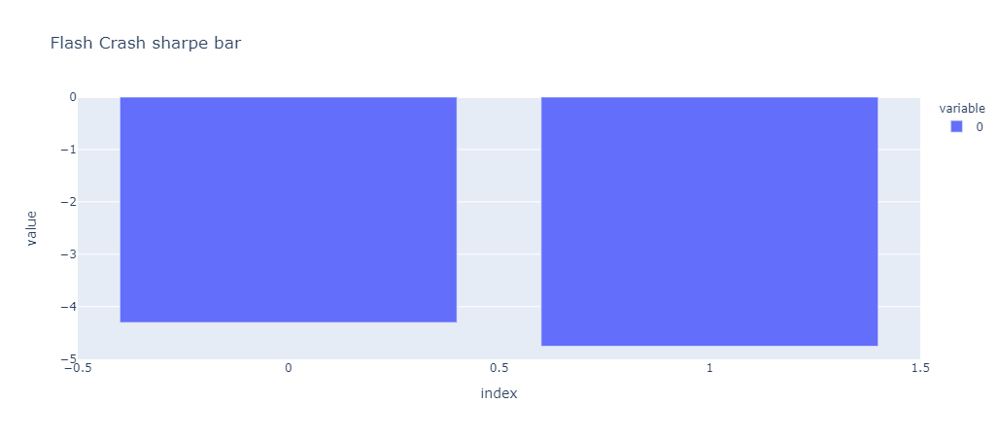

In [129]:
# Longest flash crash timeline
flash_crash_combined_port = combined_port.truncate('2010-05-06', '2010-05-20')

# Total return for flash crash time line
flash_crash_combined_port_returns = (1 + flash_crash_combined_port).cumprod()
flash_crash_combined_port_returns.reset_index(inplace=True)
flash_crash_combined_port_returns.columns=['Date','ESG','Sin']

# Plotting
flash_crash_plot = px.line(
    combined_port_returns,
    x="Date",
    y=['ESG','Sin'],
    title="Flash crash plot",
)
flash_crash_plot.show()


# Sharpe ratio for flash crash time line
flash_crash_combined_port_annual_sharpe = (flash_crash_combined_port.mean() * 252) / (flash_crash_combined_port.std() * np.sqrt(252))
flash_crash_sharpe = px.bar(
    flash_crash_combined_port_annual_sharpe,
    title="Flash Crash sharpe bar",
)
flash_crash_sharpe.show()

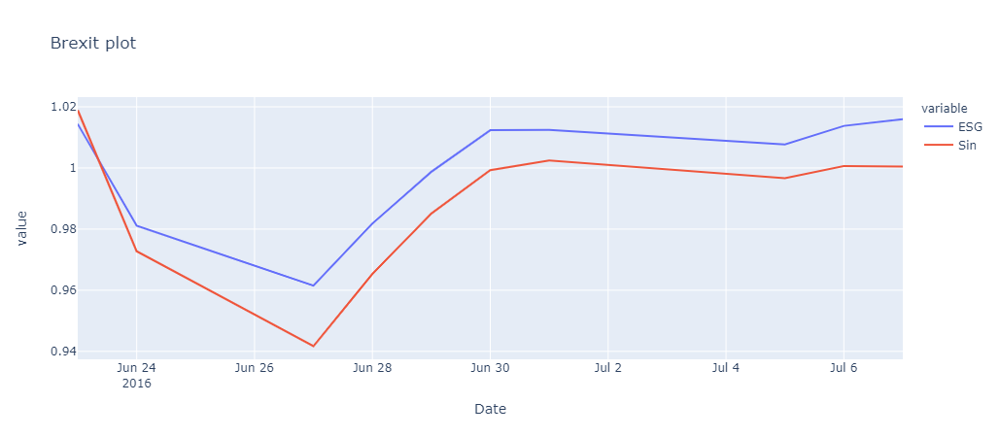

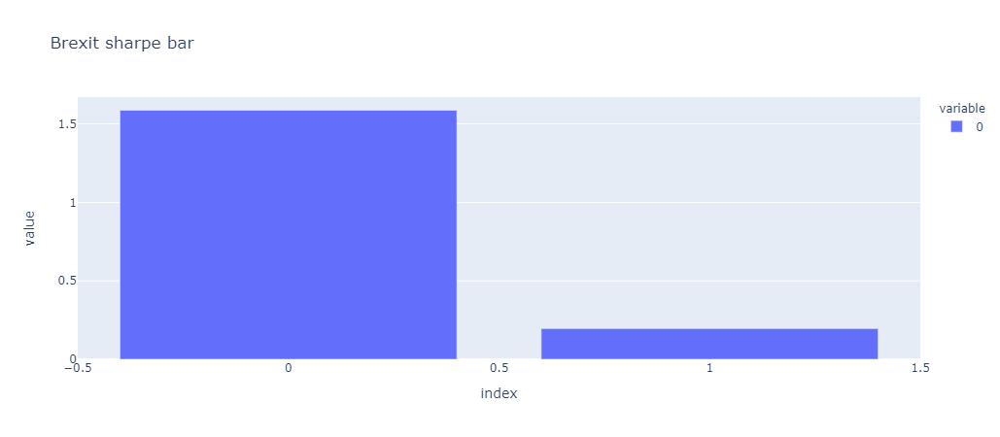

In [131]:
# Brexit timeline
brexit_combined_port = combined_port.truncate('2016-06-23', '2016-07-07')

# Total return for Brexit time line
brexit_combined_port_returns = (1 + brexit_combined_port).cumprod()
brexit_combined_port_returns.reset_index(inplace=True)
brexit_combined_port_returns.columns=['Date','ESG','Sin']

# Plotting
brexit_plot = px.line(
    brexit_combined_port_returns,
    x="Date",
    y=['ESG','Sin'],
    title="Brexit plot",
)
brexit_plot.show()


# Sharpe ratio for Brexit time line
brexit_combined_port_annual_sharpe = (brexit_combined_port.mean() * 252) / (brexit_combined_port.std() * np.sqrt(252))
brexit_sharpe = px.bar(
    brexit_combined_port_annual_sharpe,
    title="Brexit sharpe bar",
)
brexit_sharpe.show()

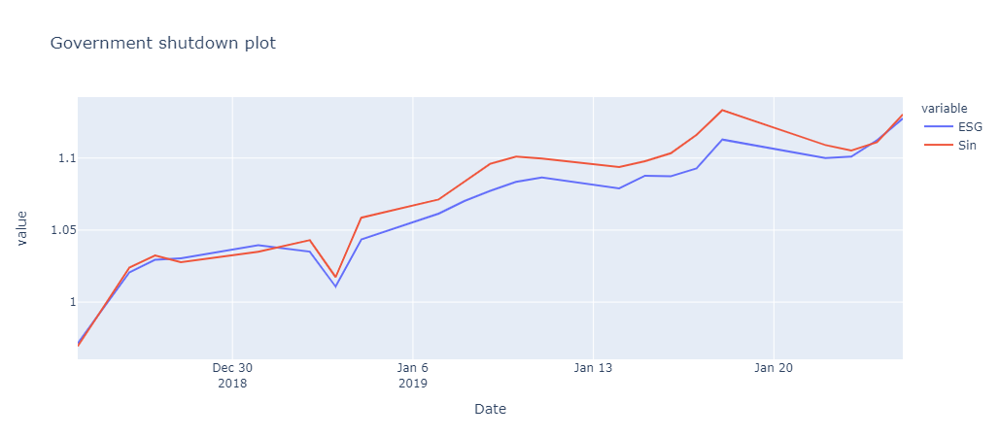

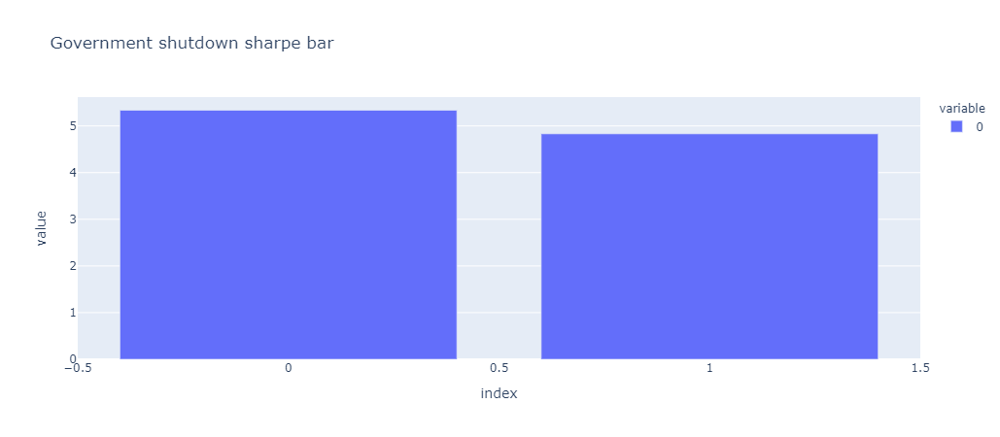

In [133]:
# Longest government shutdown timeline
gov_shut_combined_port = combined_port.truncate('2018-12-22', '2019-01-25')

# Total return for government shutdown time line
gov_shut_combined_port_returns = (1 + gov_shut_combined_port).cumprod()
gov_shut_combined_port_returns.reset_index(inplace=True)
gov_shut_combined_port_returns.columns=['Date','ESG','Sin']

# Plotting
gov_shut_plot = px.line(
    gov_shut_combined_port_returns,
    x="Date",
    y=['ESG','Sin'],
    title="Government shutdown plot",
)
gov_shut_plot.show()


# Sharpe ratio for government shutdown time line
gov_shut_combined_port_annual_sharpe = (gov_shut_combined_port.mean() * 252) / (gov_shut_combined_port.std() * np.sqrt(252))
gov_shut_sharpe = px.bar(
    gov_shut_combined_port_annual_sharpe,
    title="Government shutdown sharpe bar",
)
gov_shut_sharpe.show()

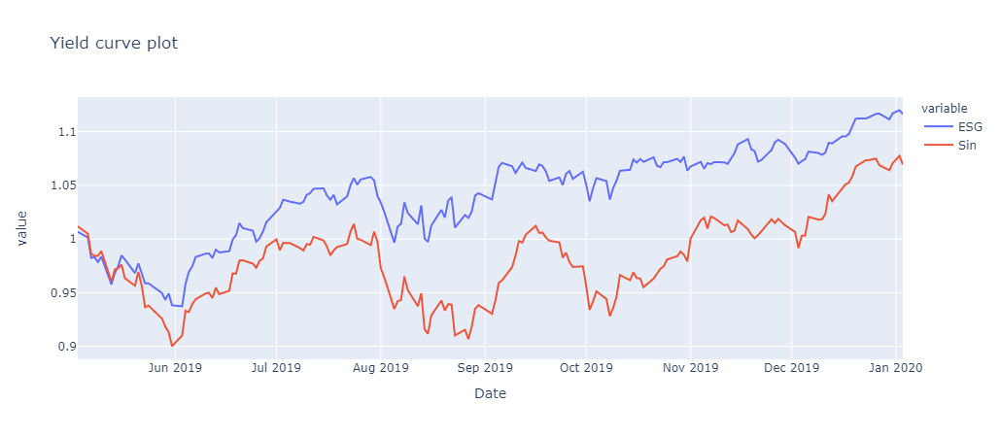

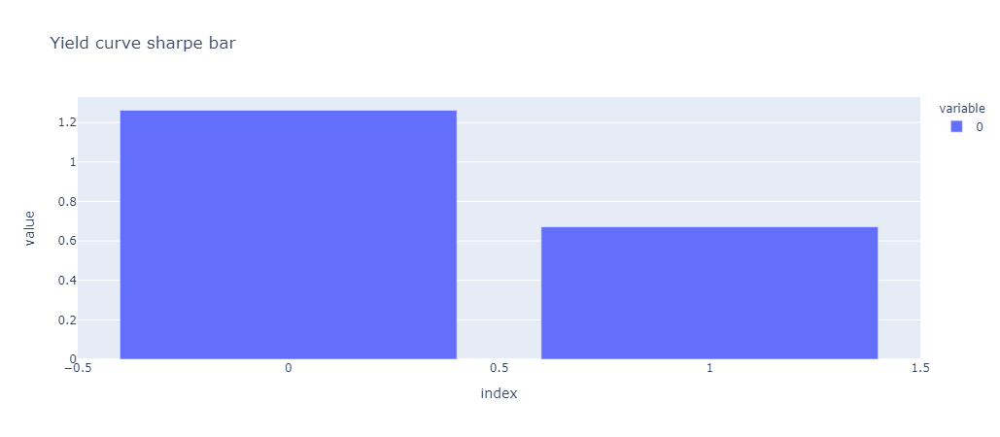

In [134]:
# Yield curve timeline
yield_curve_combined_port = combined_port.truncate('2019-05-03', '2020-01-03')

# Total return for yield curve time line
yield_curve_combined_port_returns = (1 + yield_curve_combined_port).cumprod()
yield_curve_combined_port_returns.reset_index(inplace=True)
yield_curve_combined_port_returns.columns=['Date','ESG','Sin']

# Plotting
yield_plot = px.line(
    yield_curve_combined_port_returns,
    x="Date",
    y=['ESG','Sin'],
    title="Yield curve plot",
)
yield_plot.show()


# Sharpe ratio for yield curve time line
yield_curve_combined_port_annual_sharpe = (yield_curve_combined_port.mean() * 252) / (yield_curve_combined_port.std() * np.sqrt(252))
yield_sharpe = px.bar(
    yield_curve_combined_port_annual_sharpe,
    title="Yield curve sharpe bar",
)
yield_sharpe.show()


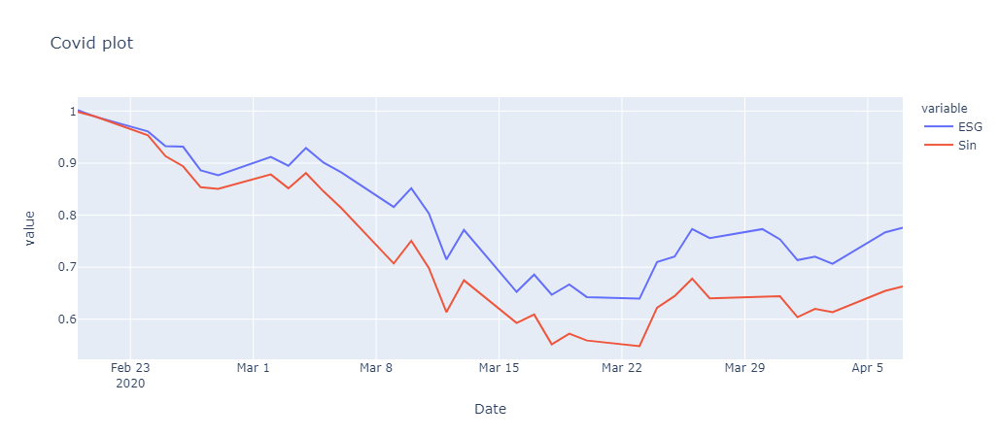

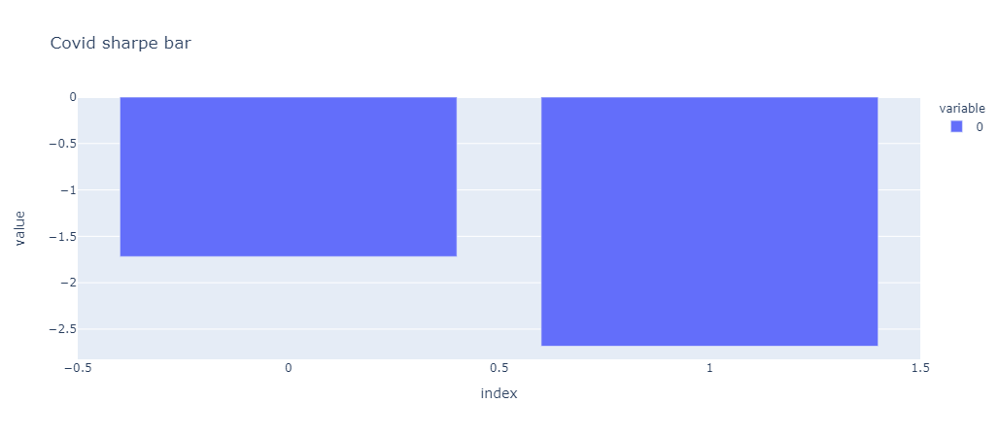

In [135]:
# Covid timeline
covid_combined_port = combined_port.truncate('2020-02-20', '2020-04-07')

# Total return for covid time line
covid_combined_port_returns = (1 + covid_combined_port).cumprod()
covid_combined_port_returns.reset_index(inplace=True)
covid_combined_port_returns.columns=['Date','ESG','Sin']

# Plotting
covid_plot = px.line(
    covid_combined_port_returns,
    x="Date",
    y=['ESG','Sin'],
    title="Covid plot",
)
covid_plot.show()
    
# Sharpe ratio for covid time line
covid_combined_port_annual_sharpe = (covid_combined_port.mean() * 252) / (covid_combined_port.std() * np.sqrt(252))
covid_sharpe = px.bar(
    covid_combined_port_annual_sharpe,
    title="Covid sharpe bar",
)
covid_sharpe.show()


In [136]:
# create the panel
panel = pn.Tabs(
    ("Home (All)", pn.Column(return_plot, sharpe_bar)),
    ("Financial Crisis", pn.Column(fin_cris_plot, fin_cris_sharpe)),
    ("Flash Crash 2010", pn.Column(flash_crash_plot, flash_crash_sharpe)),
    ("Brexit 2016", pn.Column(brexit_plot, brexit_sharpe)),
    ("Gov Shutdown 2018", pn.Column(gov_shut_plot, gov_shut_sharpe)),
    ("Yield Curve Inversion 2019", pn.Column(yield_plot, yield_sharpe)),
    ("COVID Crash", pn.Column(covid_plot, covid_sharpe))
)

In [137]:
panel.servable()

Tabs
    [0] Column
        [0] Plotly(Figure)
        [1] Plotly(Figure)
    [1] Column
        [0] Plotly(Figure)
        [1] Plotly(Figure)
    [2] Column
        [0] Plotly(Figure)
        [1] Plotly(Figure)
    [3] Column
        [0] Plotly(Figure)
        [1] Plotly(Figure)
    [4] Column
        [0] Plotly(Figure)
        [1] Plotly(Figure)
    [5] Column
        [0] Plotly(Figure)
        [1] Plotly(Figure)
    [6] Column
        [0] Plotly(Figure)
        [1] Plotly(Figure)